# Import Libraries

In [1]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Matplolib default parameters
from matplotlib import rcParams
plt.style.use('default')
plt.rcParams['axes.prop_cycle'] = plt.rcParamsDefault['axes.prop_cycle']

# import warning
import warnings
warnings.filterwarnings('ignore')

# Dataset Overview

Data colected from <a href='https://www.kaggle.com/c/new-york-city-taxi-fare-prediction'>Kaggle competition</a> and it contains about 55 million records. But for this project i will only use 120,000 records from April 11 to April 24, 2010. The records are randomly sorted

In [2]:
df = pd.read_csv('NYCTaxiFares.csv')
df.head()

,pickup_datetime,fare_amount,fare_class,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2010-04-19 08:17:56 UTC,6.5,0,-73.992365,40.730521,-73.975499,40.744746,1
1,2010-04-17 15:43:53 UTC,6.9,0,-73.990078,40.740558,-73.974232,40.744114,1
2,2010-04-17 11:23:26 UTC,10.1,1,-73.994149,40.751118,-73.960064,40.766235,2
3,2010-04-11 21:25:03 UTC,8.9,0,-73.990485,40.756422,-73.971205,40.748192,1
4,2010-04-17 02:19:01 UTC,19.7,1,-73.990976,40.734202,-73.905956,40.743115,1


In [3]:
print(f'this dataset contains of {df.shape[0]} rows and {df.shape[1]} columns')

this dataset contains of 120000 rows and 8 columns


In [4]:
# check missing values
df.isnull().sum()

pickup_datetime      0
fare_amount          0
fare_class           0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

In [5]:
# check duplicated data 
df.duplicated().sum()

0

# Feature Engineering

## Calculate the Distance Traveled in kilometers

The <a href='https://en.wikipedia.org/wiki/Haversine_formula'>haversine formula</a> calculates the distance on a sphere between two sets of GPS coordinates.<br>
Here we assign latitude values with $\varphi$ (phi) and longitude with $\lambda$ (lambda).

In [4]:
# Calculates the haversine distance between 2 sets of GPS coordinates in df
def haversine_distance(df, lat1, long1, lat2, long2):
    
    r = 6371  # average radius of Earth in kilometers
       
    phi1 = np.radians(df[lat1])
    phi2 = np.radians(df[lat2])
    
    delta_phi = np.radians(df[lat2]-df[lat1])
    delta_lambda = np.radians(df[long2]-df[long1])
     
    a = np.sin(delta_phi/2)**2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    d = (r * c) # in kilometers

    return d

In [5]:
df['dist_km'] = haversine_distance(df,'pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude')
df.head()

,pickup_datetime,fare_amount,fare_class,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dist_km
0,2010-04-19 08:17:56 UTC,6.5,0,-73.992365,40.730521,-73.975499,40.744746,1,2.126312
1,2010-04-17 15:43:53 UTC,6.9,0,-73.990078,40.740558,-73.974232,40.744114,1,1.392307
2,2010-04-17 11:23:26 UTC,10.1,1,-73.994149,40.751118,-73.960064,40.766235,2,3.326763
3,2010-04-11 21:25:03 UTC,8.9,0,-73.990485,40.756422,-73.971205,40.748192,1,1.864129
4,2010-04-17 02:19:01 UTC,19.7,1,-73.990976,40.734202,-73.905956,40.743115,1,7.231321


## Datetime

The data was saved in UTC time. Our data falls in April of 2010 which occurred during Daylight Savings Time in New York. For that reason, we'll make an adjustment to EDT using UTC-4 (subtracting four hours).

In [6]:
df['EDTdate'] = pd.to_datetime(df['pickup_datetime'].str[:19]) - pd.Timedelta(hours=4)
df['Hour'] = df['EDTdate'].dt.hour
df['AMorPM'] = np.where(df['Hour']<12,'am','pm')
df['Weekday'] = df['EDTdate'].dt.strftime("%a")
df.head()

,pickup_datetime,fare_amount,fare_class,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,dist_km,EDTdate,Hour,AMorPM,Weekday
0,2010-04-19 08:17:56 UTC,6.5,0,-73.992365,40.730521,-73.975499,40.744746,1,2.126312,2010-04-19 04:17:56,4,am,Mon
1,2010-04-17 15:43:53 UTC,6.9,0,-73.990078,40.740558,-73.974232,40.744114,1,1.392307,2010-04-17 11:43:53,11,am,Sat
2,2010-04-17 11:23:26 UTC,10.1,1,-73.994149,40.751118,-73.960064,40.766235,2,3.326763,2010-04-17 07:23:26,7,am,Sat
3,2010-04-11 21:25:03 UTC,8.9,0,-73.990485,40.756422,-73.971205,40.748192,1,1.864129,2010-04-11 17:25:03,17,pm,Sun
4,2010-04-17 02:19:01 UTC,19.7,1,-73.990976,40.734202,-73.905956,40.743115,1,7.231321,2010-04-16 22:19:01,22,pm,Fri


# Exploratory Data Analysis

In [7]:
# copy data
eda = df.copy()

# define categoric and numeric features
num = eda.select_dtypes(include='number').columns
cat = eda.select_dtypes(include='object').columns

In [11]:
cat

Index(['pickup_datetime', 'AMorPM', 'Weekday'], dtype='object')

In [12]:
num

Index(['fare_amount', 'fare_class', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'dist_km',
       'Hour'],
      dtype='object')

In [9]:
# adjust numeric features (we just need several features to do EDA)
num = ['fare_amount', 'fare_class', 'passenger_count', 'dist_km', 'Hour']
num

['fare_amount', 'fare_class', 'passenger_count', 'dist_km', 'Hour']

## Descriptive Statistic

In [10]:
eda[num].describe().T

,count,mean,std,min,25%,50%,75%,max
fare_amount,120000.0,10.040326,7.500134,2.500000,5.700000,7.700000,11.300000,49.900000
fare_class,120000.0,0.333333,0.471406,0.000000,0.000000,0.000000,1.000000,1.000000
passenger_count,120000.0,1.347167,0.759263,1.000000,1.000000,1.000000,1.000000,5.000000
dist_km,120000.0,3.322160,3.337004,0.010208,1.316428,2.237084,4.034564,28.846365
Hour,120000.0,11.920042,5.964038,0.000000,7.000000,12.000000,17.000000,23.000000


## Univariate Numeric Analysis

In [17]:
len(num)

5

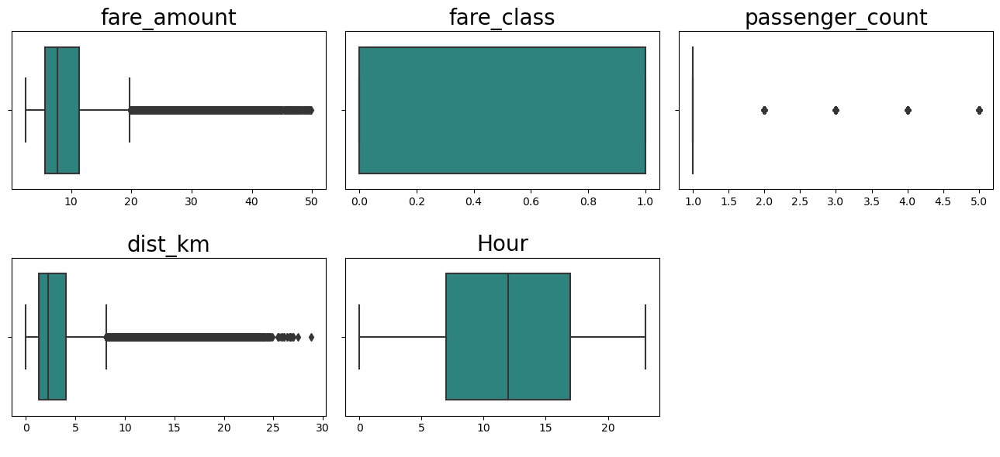

In [21]:
plt.figure(figsize=(13,6))
for i in range(0, len(num)):
    plt.subplot(2,3,i+1)
    sns.boxplot(x=eda[num[i]], palette='viridis')
    plt.title(num[i], fontsize=20)
    plt.xlabel(' ')
    plt.tight_layout()

there's no strange values, everything looks normal

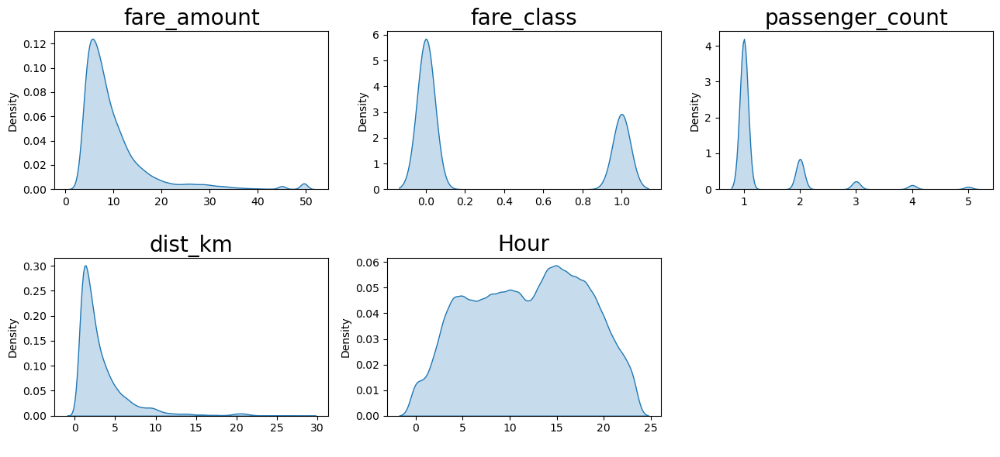

In [11]:
plt.figure(figsize=(13,6))
for i in range(0, len(num)):
    plt.subplot(2,3,i+1)
    sns.kdeplot(x=eda[num[i]], palette='viridis', shade=True)
    plt.title(num[i], fontsize=20)
    plt.xlabel(' ')
    plt.tight_layout()

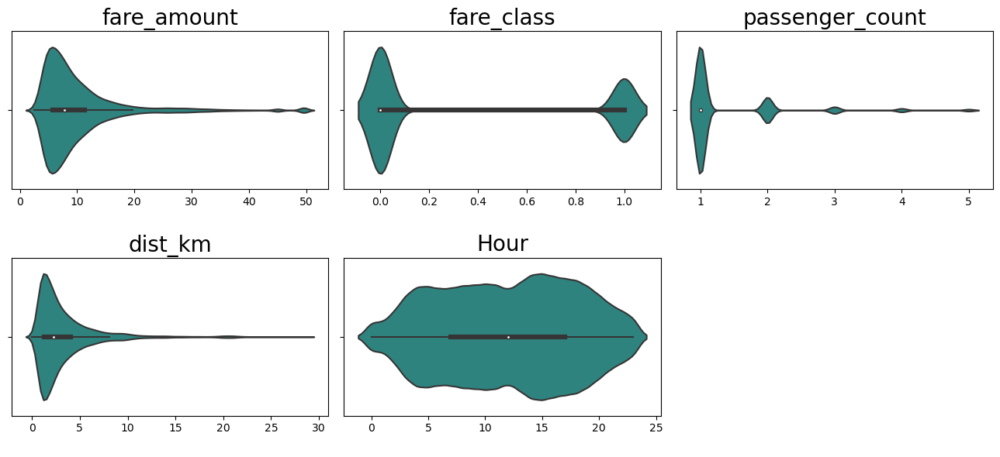

In [23]:
plt.figure(figsize=(13,6))
for i in range(0, len(num)):
    plt.subplot(2,3,i+1)
    sns.violinplot(x=eda[num[i]], palette='viridis')
    plt.title(num[i], fontsize=20)
    plt.xlabel(' ')
    plt.tight_layout()

## Univariate Category Analysis

In [12]:
len(cat)

3

In [27]:
eda[cat].nunique()

pickup_datetime    120000
AMorPM                  2
Weekday                 7
dtype: int64

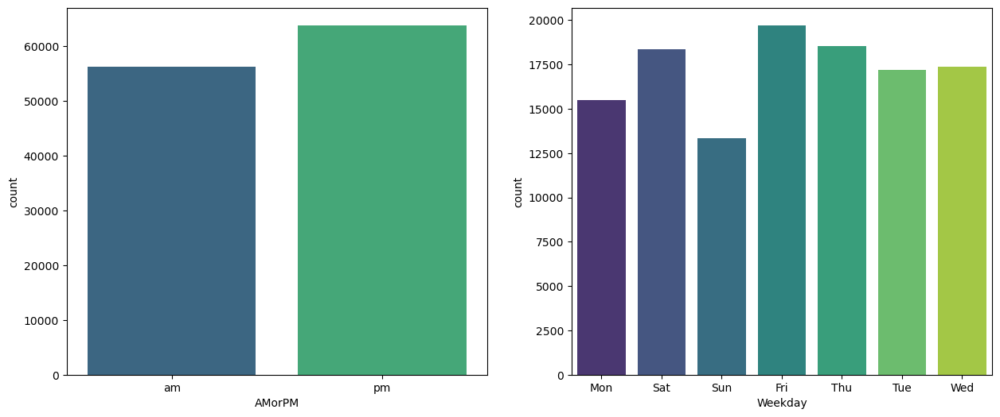

In [41]:
fig, axes = plt.subplots(1,2,figsize=(15, 6))

sns.countplot(x=eda['AMorPM'], ax=axes[0], palette='viridis')
sns.countplot(x=eda['Weekday'], ax=axes[1], palette='viridis');

## Bivariate Numeric Analysis

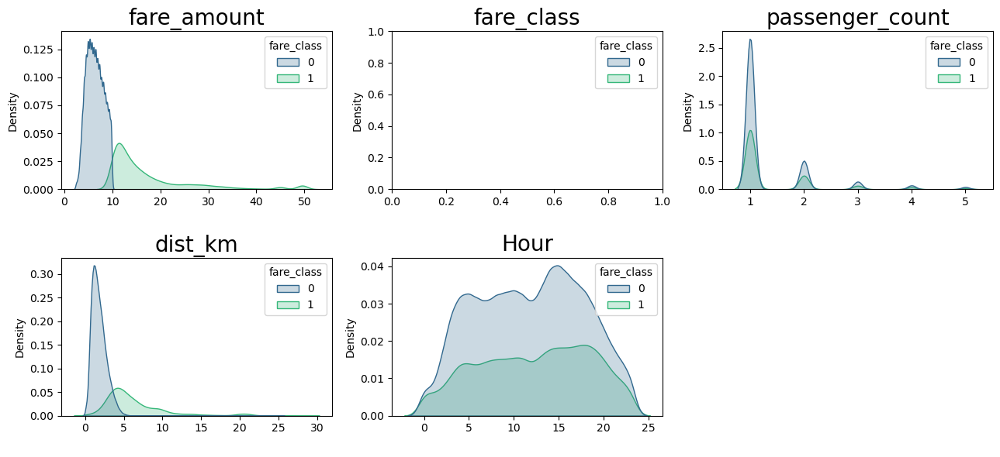

In [14]:
plt.figure(figsize=(13,6))
for i in range(0, len(num)):
    plt.subplot(2,3,i+1)
    sns.kdeplot(x=eda[num[i]], palette='viridis', shade=True, hue=eda['fare_class'])
    plt.title(num[i], fontsize=20)
    plt.xlabel(' ')
    plt.tight_layout()

## Correlation Heatmap

<AxesSubplot:>

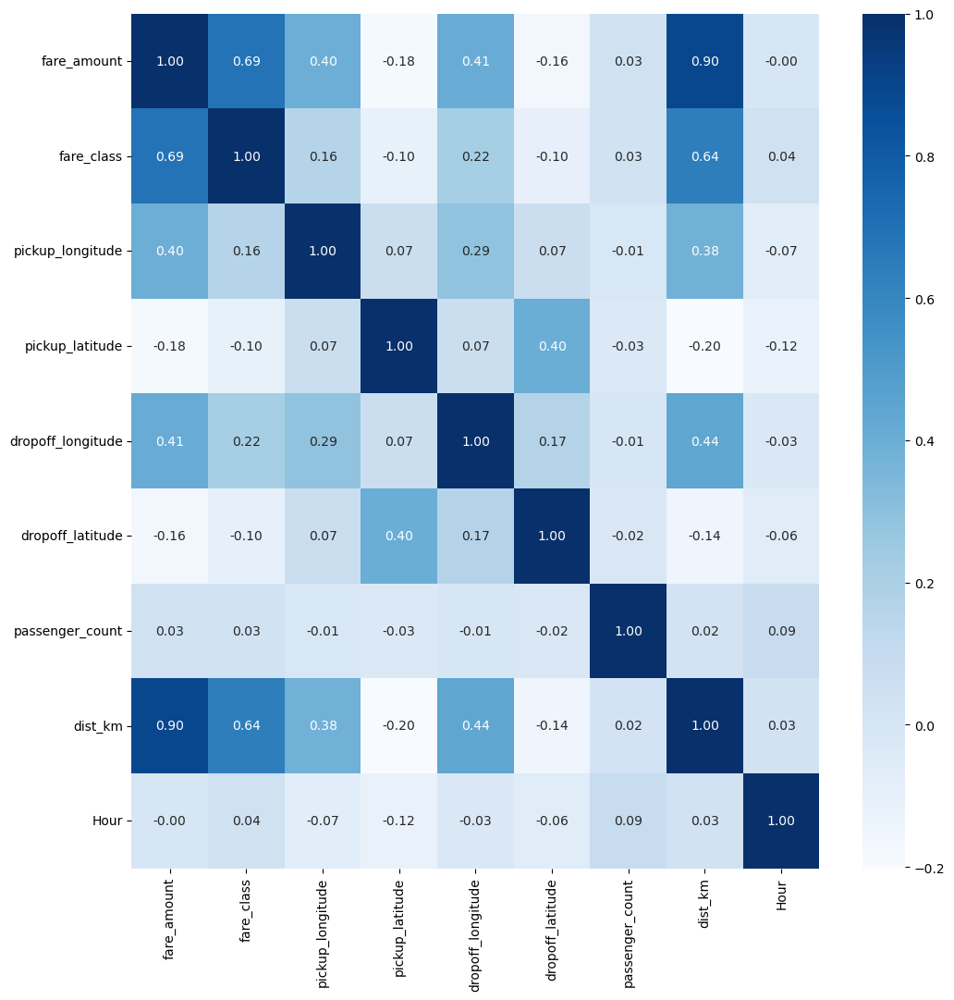

In [22]:
# Create Heatmap Correlation Chart for Each Numerical Features
plt.figure(figsize=(12, 12))
sns.heatmap(eda.corr(), cmap='Blues', annot=True, fmt='.2f')

## Pairplot

Text(0.5, 1.0, 'Multivariate Analysis')

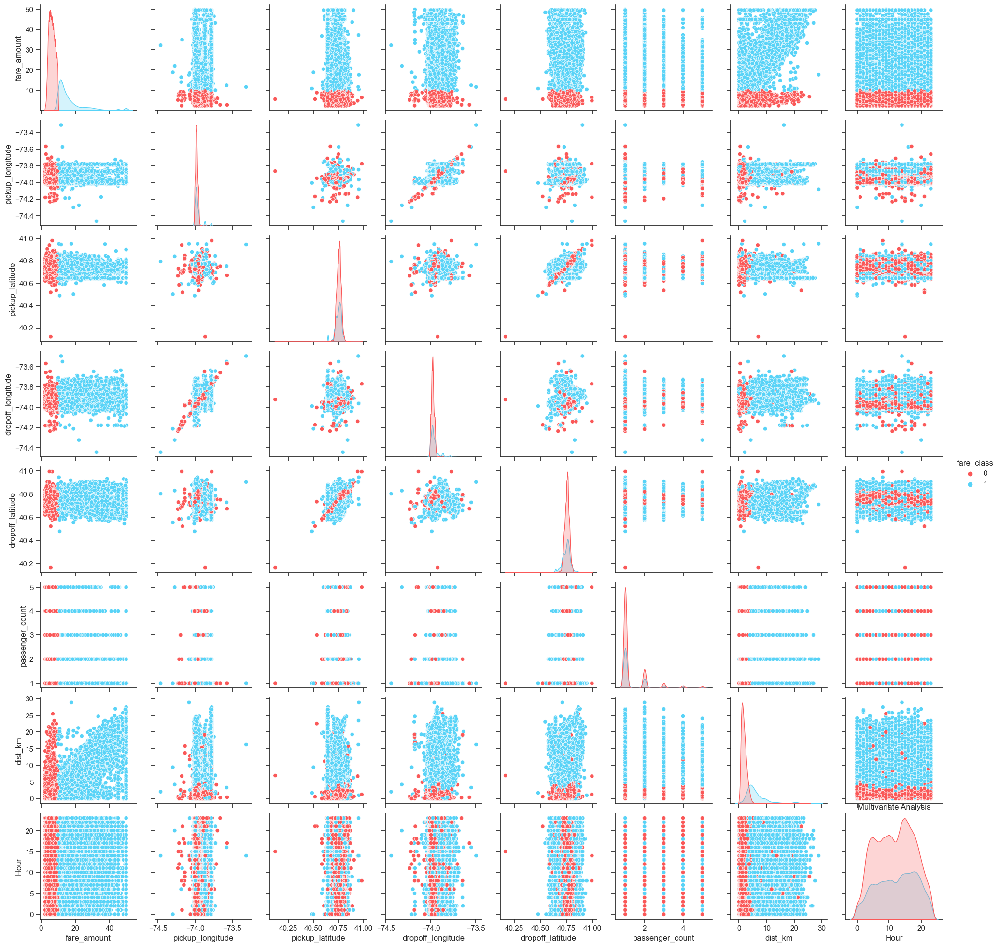

In [50]:
sns.set(style='ticks')
pal = ['#FA5858', '#58D3F7']

sns.pairplot(eda, hue='fare_class', palette=pal)
plt.title('Multivariate Analysis')

## Geographical Heatmap

In [55]:
from folium import Map
from folium.plugins import HeatMap

mapp = Map(location=[40.730610, -73.935242], zoom_start = 13)
mapp

### Pickup Interactive Geographical Heatmap

In [61]:
#Make the list of Lat an Lng
lat = df.pickup_latitude.tolist()
lng = df.pickup_longitude.tolist()

#Create the Map
mapp = Map(location=[40.730610, -73.935242], zoom_start = 13)

HeatMap(list(zip(lat, lng))).add_to(mapp)
mapp

### Drop Off Interactive Geographical Heatmap

In [62]:
#Make the list of Lat an Lng
lat = df.dropoff_latitude.tolist()
lng = df.dropoff_longitude.tolist()

#Create the Map
mapp = Map(location=[40.730610, -73.935242], zoom_start = 13)

HeatMap(list(zip(lat, lng))).add_to(mapp)
mapp

# Data Pre Processing

## Feature Engineering

### Define Category feature and Numeric Feature

In [63]:
df.columns

Index(['pickup_datetime', 'fare_amount', 'fare_class', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count', 'dist_km', 'EDTdate', 'Hour', 'AMorPM', 'Weekday'],
      dtype='object')

In [42]:
cat_cols = ['Hour', 'AMorPM', 'Weekday']
cont_cols = ['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude', 'passenger_count', 'dist_km']
y_col = ['fare_class']

### Categorify

In [43]:
# Convert our three categorical columns to category dtypes.
for cat in cat_cols:
    df[cat] = df[cat].astype('category')

In [66]:
df.dtypes

pickup_datetime              object
fare_amount                 float64
fare_class                    int64
pickup_longitude            float64
pickup_latitude             float64
dropoff_longitude           float64
dropoff_latitude            float64
passenger_count               int64
dist_km                     float64
EDTdate              datetime64[ns]
Hour                       category
AMorPM                     category
Weekday                    category
dtype: object

In [69]:
df['Hour'].value_counts()

15    7100
14    6972
16    6731
17    6487
18    6358
13    5994
10    5928
11    5849
9     5766
8     5730
4     5655
19    5652
5     5649
7     5420
6     5349
12    5136
3     4665
20    4664
21    3573
22    2893
2     2855
23    2237
0     1768
1     1569
Name: Hour, dtype: int64

In [70]:
df['AMorPM'].value_counts()

pm    63797
am    56203
Name: AMorPM, dtype: int64

In [72]:
df['AMorPM'].head().cat.codes

0    0
1    0
2    0
3    1
4    1
dtype: int8

In [73]:
df['Weekday'].head().cat.codes

0    1
1    2
2    2
3    3
4    0
dtype: int8

### Stacking

In [44]:
# we want to combine the three categorical columns into one input array using np.stack 
# We don't want the Series index, just the values.

hr = df['Hour'].cat.codes.values
ampm = df['AMorPM'].cat.codes.values
wkdy = df['Weekday'].cat.codes.values

cats = np.stack([hr, ampm, wkdy], 1)

cats[:5]

array([[ 4,  0,  1],
       [11,  0,  2],
       [ 7,  0,  2],
       [17,  1,  3],
       [22,  1,  0]], dtype=int8)

### Convert numpy arrays to tensors

In [45]:
# Convert categorical variables to a tensor
cats = torch.tensor(cats, dtype=torch.int64)
# this syntax is ok, since the source data is an array, not an existing tensor

cats[:5]

tensor([[ 4,  0,  1],
        [11,  0,  2],
        [ 7,  0,  2],
        [17,  1,  3],
        [22,  1,  0]])

In [46]:
# Convert continuous variables to a tensor
conts = np.stack([df[col].values for col in cont_cols], 1)
conts = torch.tensor(conts, dtype=torch.float)
conts[:5]

tensor([[ 40.7305, -73.9924,  40.7447, -73.9755,   1.0000,   2.1263],
        [ 40.7406, -73.9901,  40.7441, -73.9742,   1.0000,   1.3923],
        [ 40.7511, -73.9941,  40.7662, -73.9601,   2.0000,   3.3268],
        [ 40.7564, -73.9905,  40.7482, -73.9712,   1.0000,   1.8641],
        [ 40.7342, -73.9910,  40.7431, -73.9060,   1.0000,   7.2313]])

In [47]:
# Convert labels to a tensor
y = torch.tensor(df[y_col].values).flatten()

y[:5]

tensor([0, 0, 1, 0, 1])

In [79]:
print(cats.shape)
print(conts.shape)
print(y.shape)

torch.Size([120000, 3])
torch.Size([120000, 6])
torch.Size([120000, 1])


## Set an embedding size

In [48]:
# This will set embedding sizes for Hours, AMvsPM and Weekdays
# The rule of thumb for determining the embedding size is to divide the number of unique entries in each column by 2, but not to exceed 50.

cat_szs = [len(df[col].cat.categories) for col in cat_cols]
emb_szs = [(size, min(50, (size+1)//2)) for size in cat_szs]
emb_szs

[(24, 12), (2, 1), (7, 4)]

# Modeling

## Build Model

In [49]:
class TabularModel(nn.Module):

# emb_szs: list of tuples: each categorical variable size is paired with an embedding size
# n_cont: int: number of continuous variables
# out_sz: int: output size
# layers: list of ints: layer sizes
# p: float: dropout probability for each layer (for simplicity we'll use the same value throughout    

    def __init__(self, emb_szs, n_cont, out_sz, layers, p=0.5):
        super().__init__()
        self.embeds = nn.ModuleList([nn.Embedding(ni, nf) for ni,nf in emb_szs])
        self.emb_drop = nn.Dropout(p)
        self.bn_cont = nn.BatchNorm1d(n_cont)
        
        layerlist = []
        n_emb = sum((nf for ni,nf in emb_szs))
        n_in = n_emb + n_cont
        
        for i in layers:
            layerlist.append(nn.Linear(n_in,i)) 
            layerlist.append(nn.ReLU(inplace=True))
            layerlist.append(nn.BatchNorm1d(i))
            layerlist.append(nn.Dropout(p))
            n_in = i
        layerlist.append(nn.Linear(layers[-1],out_sz))
            
        self.layers = nn.Sequential(*layerlist)
    
    def forward(self, x_cat, x_cont):
        embeddings = []
        for i,e in enumerate(self.embeds):
            embeddings.append(e(x_cat[:,i]))
        x = torch.cat(embeddings, 1)
        x = self.emb_drop(x)
        
        x_cont = self.bn_cont(x_cont)
        x = torch.cat([x, x_cont], 1)
        x = self.layers(x)
        return x

In [50]:
torch.manual_seed(33)
model = TabularModel(emb_szs, conts.shape[1], 2, [200,100], p=0.4)

In [34]:
model

TabularModel(
  (embeds): ModuleList(
    (0): Embedding(24, 12)
    (1): Embedding(2, 1)
    (2): Embedding(7, 4)
  )
  (emb_drop): Dropout(p=0.4, inplace=False)
  (bn_cont): BatchNorm1d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): Sequential(
    (0): Linear(in_features=23, out_features=200, bias=True)
    (1): ReLU(inplace=True)
    (2): BatchNorm1d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.4, inplace=False)
    (4): Linear(in_features=200, out_features=100, bias=True)
    (5): ReLU(inplace=True)
    (6): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.4, inplace=False)
    (8): Linear(in_features=100, out_features=2, bias=True)
  )
)

## Define loss function & optimizer

In [51]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

## Train Test Split

In [85]:
len(df)

120000

In [52]:
batch_size = 60000
test_size = 12000

cat_train = cats[:batch_size-test_size]
cat_test = cats[batch_size-test_size:batch_size]
con_train = conts[:batch_size-test_size]
con_test = conts[batch_size-test_size:batch_size]
y_train = y[:batch_size-test_size]
y_test = y[batch_size-test_size:batch_size]

In [53]:
print(cat_train.shape)
print(cat_test.shape)
print(con_train.shape)
print(con_test.shape)
print(y_train.shape)
print(y_test.shape)

torch.Size([48000, 3])
torch.Size([12000, 3])
torch.Size([48000, 6])
torch.Size([12000, 6])
torch.Size([48000])
torch.Size([12000])


## Train the model

In [56]:
# import time to find how long the model trained
import time
start_time = time.time()

epochs = 300
losses = []

for i in range(epochs):
    i+=1
    y_pred = model(cat_train, con_train)
    loss = criterion(y_pred, y_train)
    losses.append(loss.detach().numpy())
    
    # a neat trick to save screen space:
    if i%25 == 1:
        print(f'epoch: {i:3}  loss: {loss.item():10.8f}')

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

print(f'epoch: {i:3}  loss: {loss.item():10.8f}') # print the last line
print(f'\nDuration: {time.time() - start_time:.0f} seconds') # print the time elapsed

epoch:   1  loss: 0.25752228
epoch:  26  loss: 0.25532717
epoch:  51  loss: 0.25141659
epoch:  76  loss: 0.24995266
epoch: 101  loss: 0.24785581
epoch: 126  loss: 0.24633794
epoch: 151  loss: 0.24602395
epoch: 176  loss: 0.24266469
epoch: 201  loss: 0.24317715
epoch: 226  loss: 0.24109189
epoch: 251  loss: 0.24060044
epoch: 276  loss: 0.23850897
epoch: 300  loss: 0.23827761

Duration: 109 seconds


## Loss Function Plot

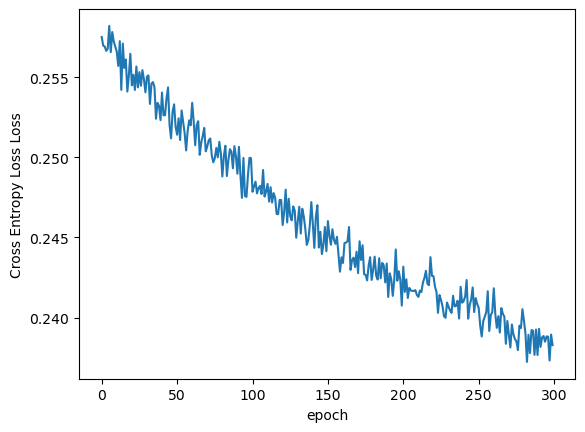

In [57]:
plt.plot(range(epochs), losses)
plt.ylabel('Cross Entropy Loss Loss')
plt.xlabel('epoch');

## Model Validation

In [58]:
# TO EVALUATE THE ENTIRE TEST SET
with torch.no_grad():
    y_val = model(cat_test, con_test)
    loss = criterion(y_val, y_test)
print(f'CE Loss: {loss:.8f}')

CE Loss: 0.24054700


Now let's look at the first 50 predicted values

In [59]:
rows = 50
correct = 0
print(f'{"MODEL OUTPUT":26} ARGMAX  Y_TEST')
for i in range(rows):
    print(f'{str(y_val[i]):26} {y_val[i].argmax():^7}{y_test[i]:^7}')
    if y_val[i].argmax().item() == y_test[i]:
        correct += 1
print(f'\n{correct} out of {rows} = {100*correct/rows:.2f}% correct')

MODEL OUTPUT               ARGMAX  Y_TEST
tensor([ 2.2008, -1.8469])    0      0   
tensor([-1.6728,  1.0638])    1      0   
tensor([ 1.9425, -1.7237])    0      0   
tensor([-0.4519,  1.1847])    1      1   
tensor([ 2.6657, -2.1116])    0      0   
tensor([ 1.6312, -1.5709])    0      0   
tensor([ 1.8489, -1.7593])    0      0   
tensor([-3.5499,  0.6208])    1      1   
tensor([ 1.6302, -1.4714])    0      0   
tensor([-0.6880,  0.1316])    1      1   
tensor([ 2.7219, -1.5451])    0      0   
tensor([ 2.5990, -1.4991])    0      0   
tensor([ 0.6874, -1.7335])    0      0   
tensor([-1.5414,  0.5147])    1      1   
tensor([ 2.1180, -1.9135])    0      0   
tensor([-2.8283,  3.8030])    1      1   
tensor([ 2.2530, -2.0152])    0      1   
tensor([ 1.8189, -2.2361])    0      0   
tensor([ 1.2277, -0.7450])    0      0   
tensor([ 2.4534, -1.9663])    0      0   
tensor([-2.1506,  1.0239])    1      1   
tensor([-0.3776, -0.2645])    1      1   
tensor([-2.3236,  0.9448])    1   